In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 617.4/617.4 kB 9.5 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from ultralytics import YOLO
import os
import shutil
from sklearn.model_selection import train_test_split
import random

In [ ]:
root = '/content/drive/MyDrive/Parigi Yolo'

In [ ]:
import os
from random import choice

#arrays to store file names
imgs =[]
xmls =[]

#setup dir names
trainPath =('/content/drive/MyDrive/parigi250/images/train')
valPath = ('/content/drive/MyDrive/parigi250/images/val')
crsPath = ('/content/drive/MyDrive/plantation') #dir where images and annotations stored

#setup ratio (val ratio = rest of the files in origin dir after splitting into train and test)
train_ratio = 0.8
val_ratio = 0.2


#total count of imgs
totalImgCount = len(os.listdir(crsPath))/2

#soring files to corresponding arrays
for (dirname, dirs, files) in os.walk(crsPath):
    for filename in files:
        if filename.endswith('.txt'):
            xmls.append(filename)
        else:
            imgs.append(filename)


#counting range for cycles
countForTrain = int(len(imgs)*train_ratio)
countForVal = int(len(imgs)*val_ratio)
print("training images are : ",countForTrain)
print("Validation images are : ",countForVal)

training images are :  204
Validation images are :  51


In [ ]:
import shutil, sys
trainimagePath = ('/content/drive/MyDrive/parigi250/images/train')
trainlabelPath = ('/content/drive/MyDrive/parigi250/labels/train')
valimagePath = ('/content/drive/MyDrive/parigi250/images/val')
vallabelPath = ('/content/drive/MyDrive/parigi250/labels/val')
#cycle for train dir
for x in range(countForTrain):

    fileJpg = choice(imgs) # get name of random image from origin dir
    fileXml = fileJpg[:-4] +'.txt' # get name of corresponding annotation file

    #move both files into train dir
    #shutil.move(os.path.join(crsPath, fileJpg), os.path.join(trainimagePath, fileJpg))
    #shutil.move(os.path.join(crsPath, fileXml), os.path.join(trainlabelPath, fileXml))
    shutil.copy(os.path.join(crsPath, fileJpg), os.path.join(trainimagePath, fileJpg))
    shutil.copy(os.path.join(crsPath, fileXml), os.path.join(trainlabelPath, fileXml))


    #remove files from arrays
    imgs.remove(fileJpg)
    xmls.remove(fileXml)



#cycle for test dir
for x in range(countForVal):

    fileJpg = choice(imgs) # get name of random image from origin dir
    fileXml = fileJpg[:-4] +'.txt' # get name of corresponding annotation file

    #move both files into train dir
    #shutil.move(os.path.join(crsPath, fileJpg), os.path.join(valimagePath, fileJpg))
    #shutil.move(os.path.join(crsPath, fileXml), os.path.join(vallabelPath, fileXml))
    shutil.copy(os.path.join(crsPath, fileJpg), os.path.join(valimagePath, fileJpg))
    shutil.copy(os.path.join(crsPath, fileXml), os.path.join(vallabelPath, fileXml))

    #remove files from arrays
    imgs.remove(fileJpg)
    xmls.remove(fileXml)

#rest of files will be validation files, so rename origin dir to val dir
#os.rename(crsPath, valPath)
#shutil.move(crsPath, valPath)

**TRAINING WITH YOLOV8N**

In [ ]:
# Define the model
model = YOLO("yolov8n.pt")

# Use the model
model.train(data=os.path.join(root,'/content/drive/MyDrive/data250.yaml'), epochs=100, patience = 80)

100%|██████████| 6.23M/6.23M [00:00<00:00, 115MB/s]
Ultralytics YOLOv8.0.194 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/data250.yaml, epochs=100, patience=80, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_m

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x78b06de7f1c0>
fitness: 0.4567132641920769
keys: ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']
maps: array([    0.23876,     0.61138,     0.40209])
names: {0: 'dead', 1: 'good', 2: 'stunted'}
plot: True
results_dict: {'metrics/precision(B)': 0.7762123370106727, 'metrics/recall(B)': 0.7906781621360248, 'metrics/mAP50(B)': 0.8104459157678282, 'metrics/mAP50-95(B)': 0.4174096362392156, 'fitness': 0.4567132641920769}
save_dir: PosixPath('runs/detect/train')
speed: {'preprocess': 2.6269987517712163, 'inference': 2.7537112142525464, 'loss': 0.0008601768344056373, 'postprocess': 4.628634920307235}

**YOLOV8N RESULTS**

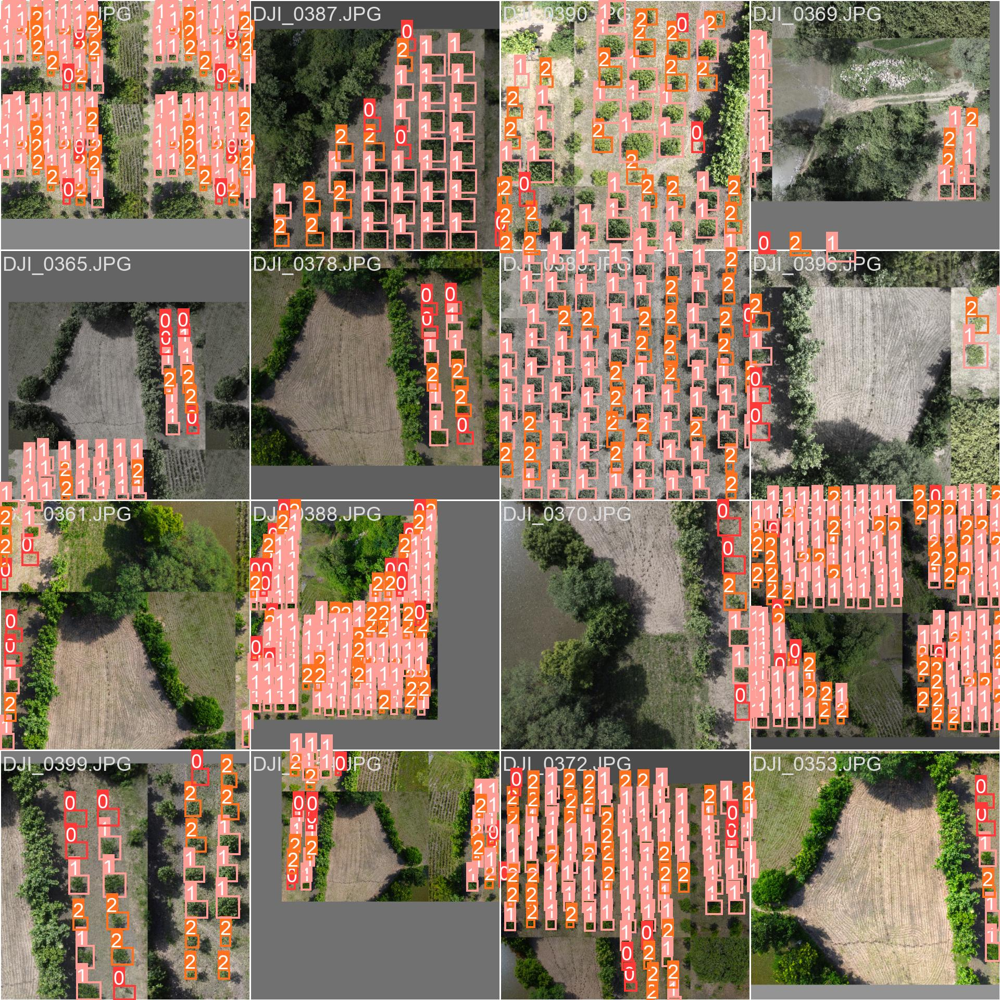

In [ ]:
Image(filename='/content/runs/detect/train5/train_batch0.jpg', width=1000)

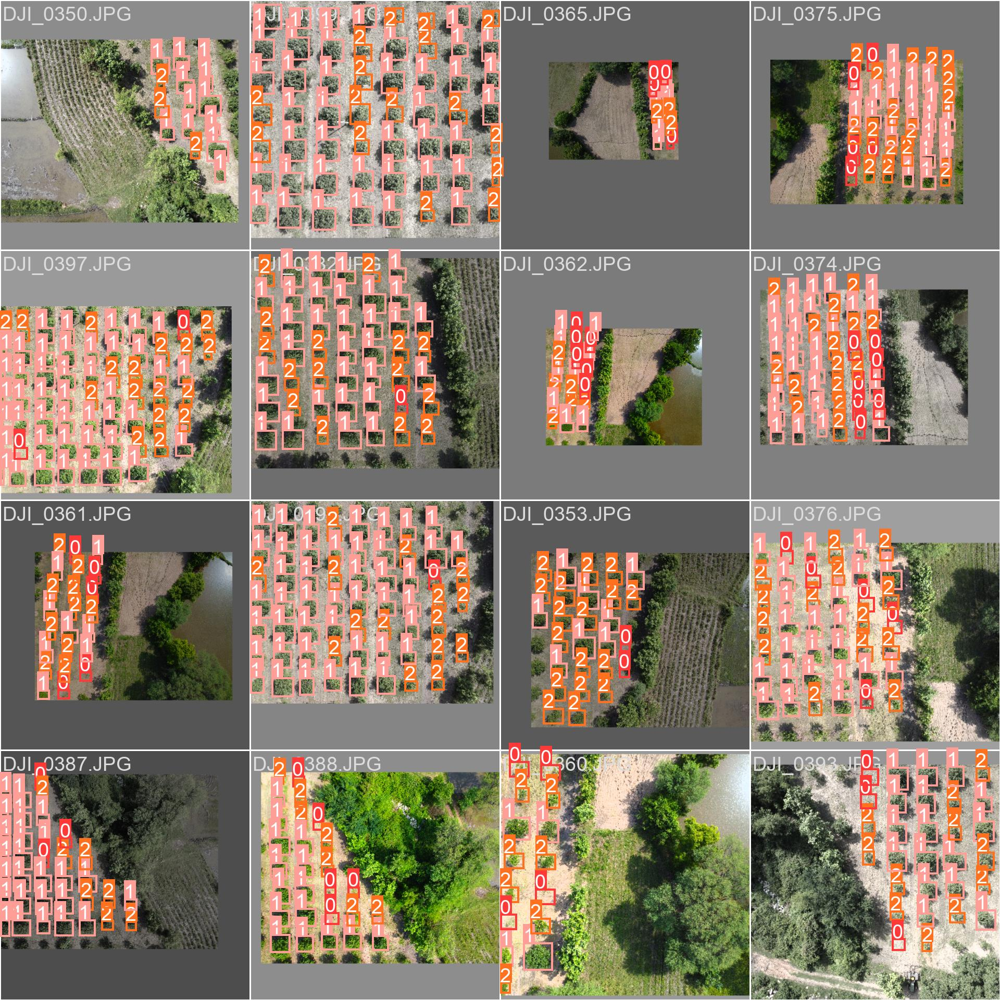

In [ ]:
Image(filename='/content/runs/detect/train5/train_batch270.jpg', width=1000)

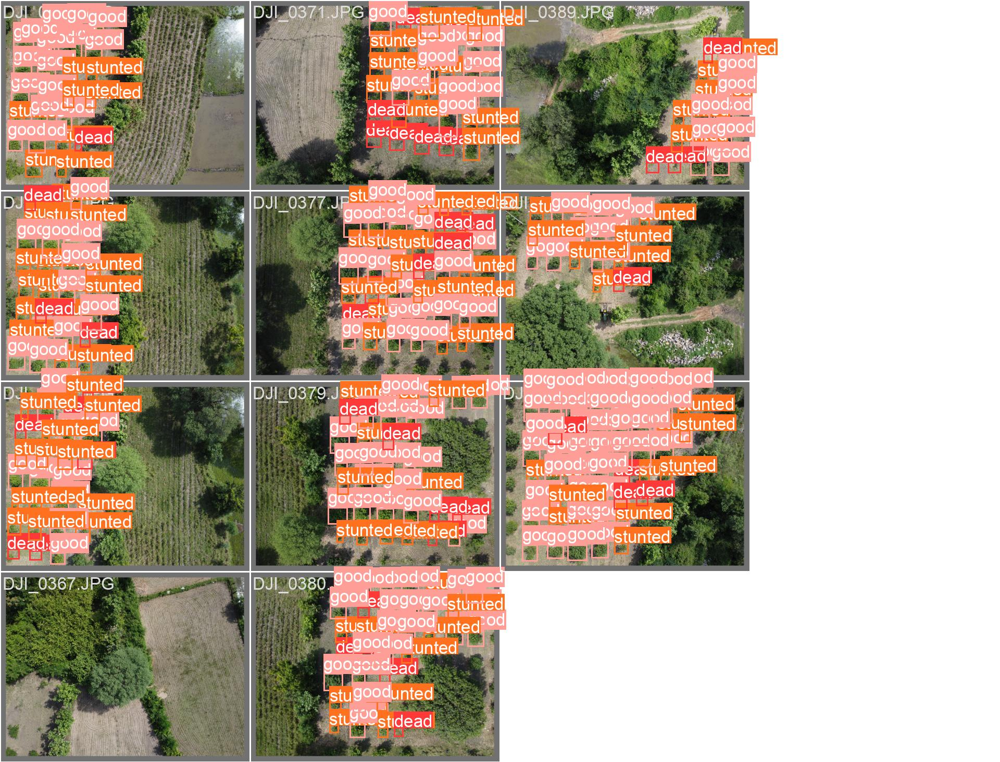

In [ ]:
Image(filename='/content/runs/detect/train5/val_batch0_labels.jpg', width=1000)

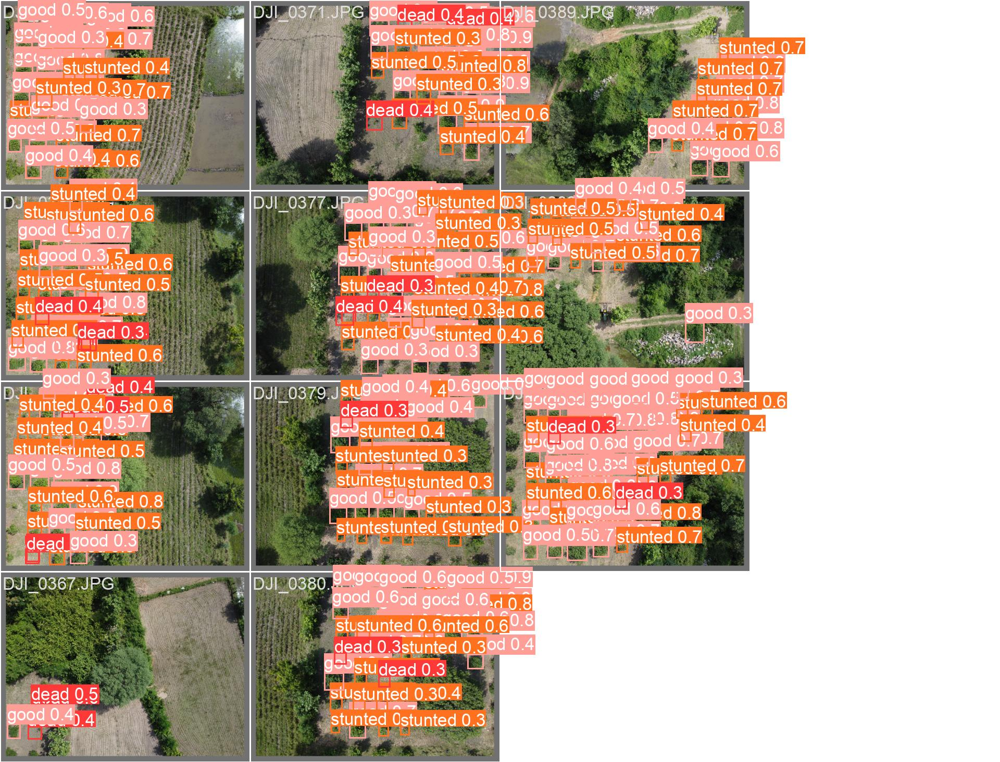

In [ ]:
Image(filename='/content/runs/detect/train5/val_batch0_pred.jpg', width=1000)

**VALIDATION WITH YOLOV8N**

In [ ]:
model.val(save_json=True)

Ultralytics YOLOv8.0.194 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3006233 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/drive/MyDrive/parigi250/labels/val.cache... 51 images, 0 backgrounds, 0 corrupt: 100%|██████████| 51/51 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:36<00:00,  9.22s/it]
                   all         51       1817      0.777      0.791      0.811      0.418
                  dead         51        162      0.712      0.625      0.654      0.237
                  good         51       1054      0.836       0.91      0.921      0.612
               stunted         51        601      0.782      0.839      0.858      0.404
Speed: 5.2ms preprocess, 51.6ms inference, 0.0ms loss, 9.0ms postprocess per image
Saving runs/detect/val/predictions.json...
Results saved to runs/detect/val


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x78b06aba3040>
fitness: 0.45690700356608593
keys: ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']
maps: array([    0.23674,     0.61241,     0.40353])
names: {0: 'dead', 1: 'good', 2: 'stunted'}
plot: True
results_dict: {'metrics/precision(B)': 0.7765122068836582, 'metrics/recall(B)': 0.7911883493631585, 'metrics/mAP50(B)': 0.8110265350617168, 'metrics/mAP50-95(B)': 0.41756038895546027, 'fitness': 0.45690700356608593}
save_dir: PosixPath('runs/detect/val')
speed: {'preprocess': 5.184697169883579, 'inference': 51.55485751582127, 'loss': 0.0017063290465111826, 'postprocess': 9.045226901185279}

**RESULTS OF YOLOV8N**

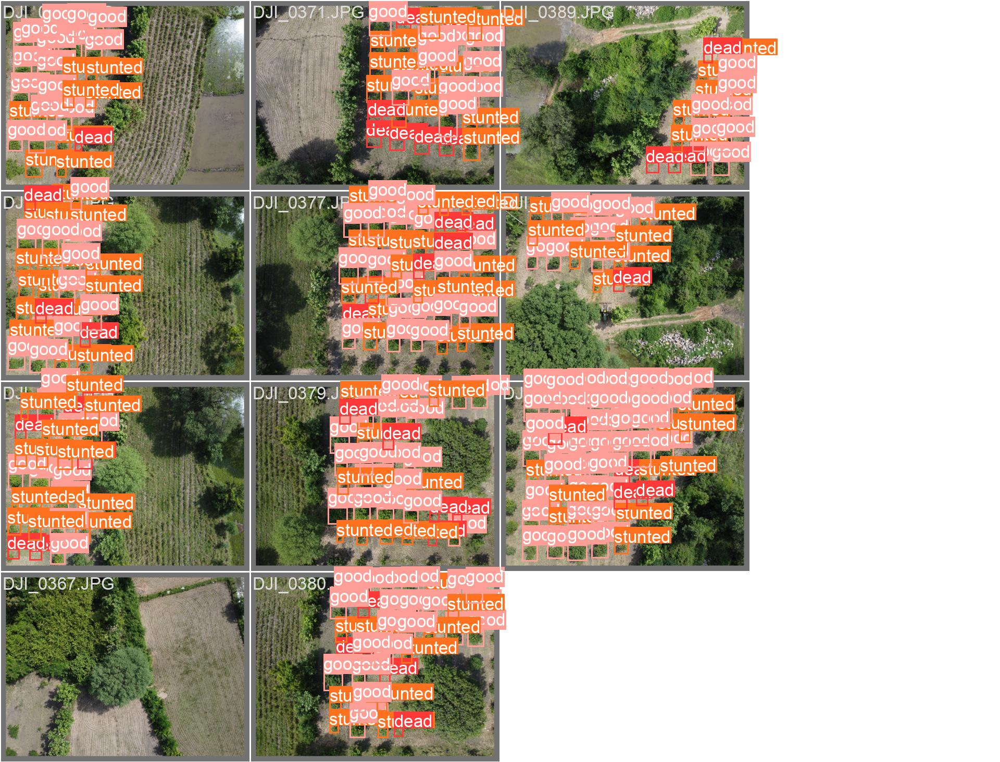

In [ ]:
Image(filename='/content/runs/detect/val/val_batch0_labels.jpg', width=1000)

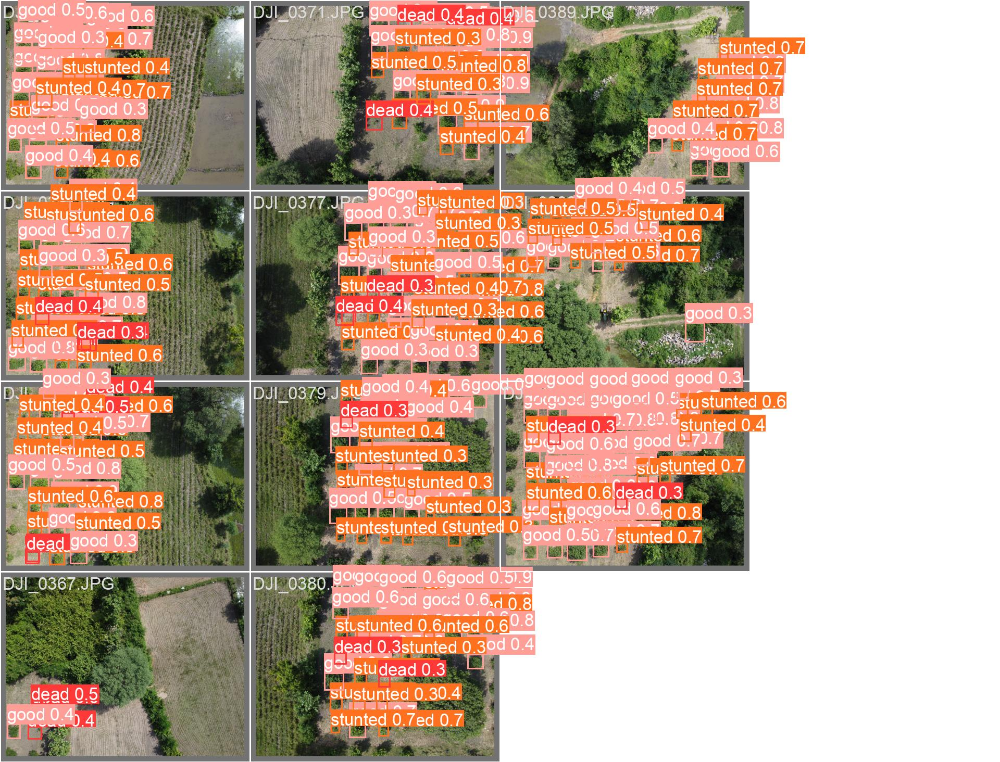

In [ ]:
Image(filename='/content/runs/detect/val/val_batch0_pred.jpg', width=1000)

**TRANINIG WITH YOLOV8S**

In [ ]:
# Define the model
model = YOLO("yolov8s.pt")

# Use the model
model.train(data=os.path.join(root,'/content/drive/MyDrive/data250.yaml'), epochs=100, patience = 80)

Ultralytics YOLOv8.0.194 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/drive/MyDrive/data250.yaml, epochs=100, patience=80, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=Fa

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x78b0f6140640>
fitness: 0.4431255478573358
keys: ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']
maps: array([    0.21728,     0.60208,     0.39708])
names: {0: 'dead', 1: 'good', 2: 'stunted'}
plot: True
results_dict: {'metrics/precision(B)': 0.7608066119077215, 'metrics/recall(B)': 0.7733812166360631, 'metrics/mAP50(B)': 0.781950341377646, 'metrics/mAP50-95(B)': 0.40547834857730136, 'fitness': 0.4431255478573358}
save_dir: PosixPath('runs/detect/train3')
speed: {'preprocess': 5.779635672475777, 'inference': 4.53045321445839, 'loss': 0.0008227778416053922, 'postprocess': 5.690331552542893}

**TRANING RESULTS BY YOLOV8S**

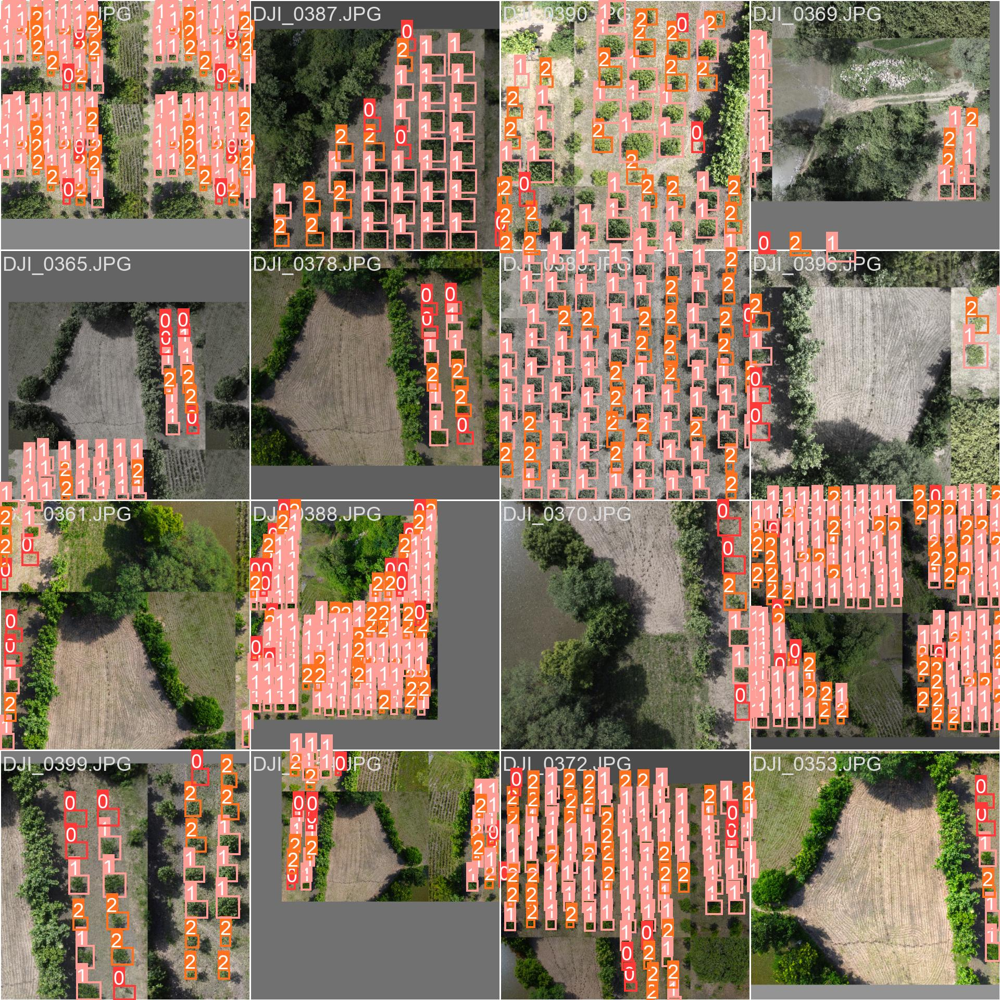

In [ ]:
Image(filename='/content/runs/detect/train6/train_batch0.jpg', width=1000)

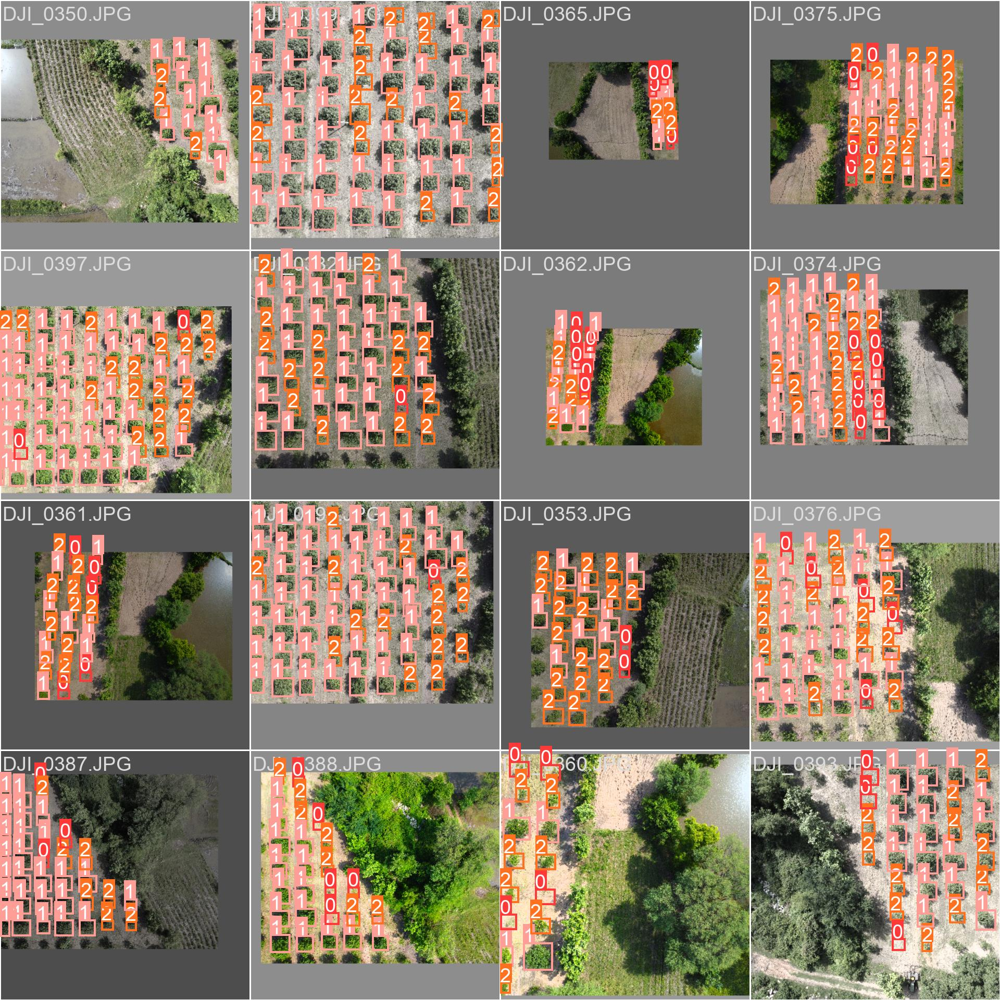

In [ ]:
Image(filename='/content/runs/detect/train6/train_batch270.jpg', width=1000)

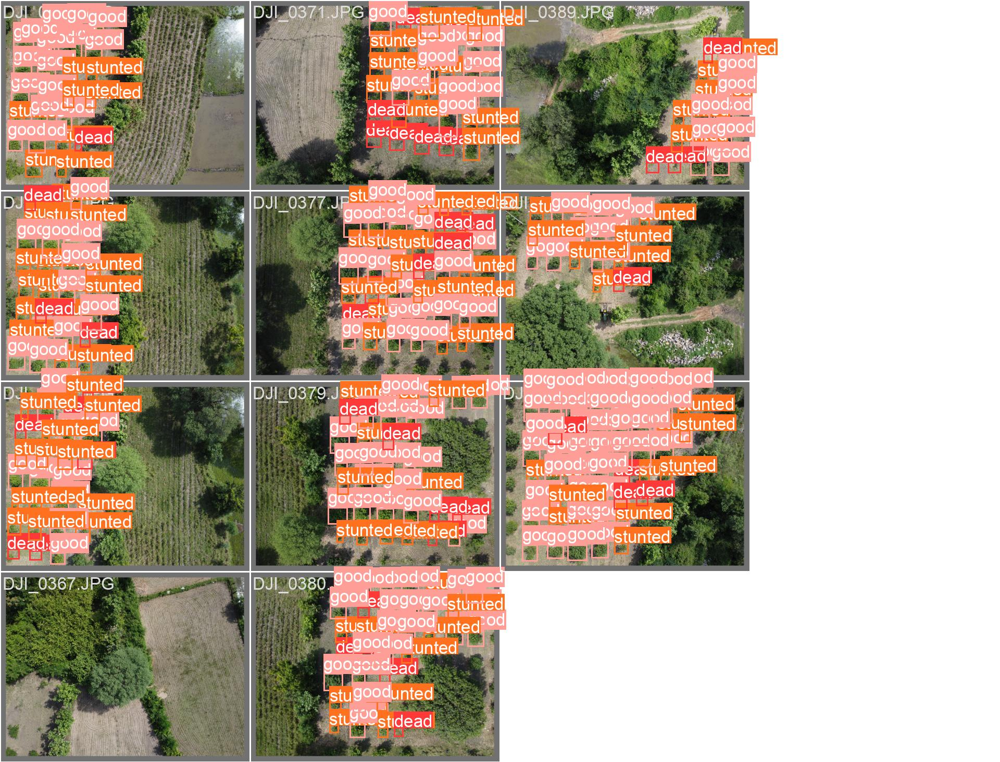

In [ ]:
Image(filename='/content/runs/detect/train6/val_batch0_labels.jpg', width=1000)

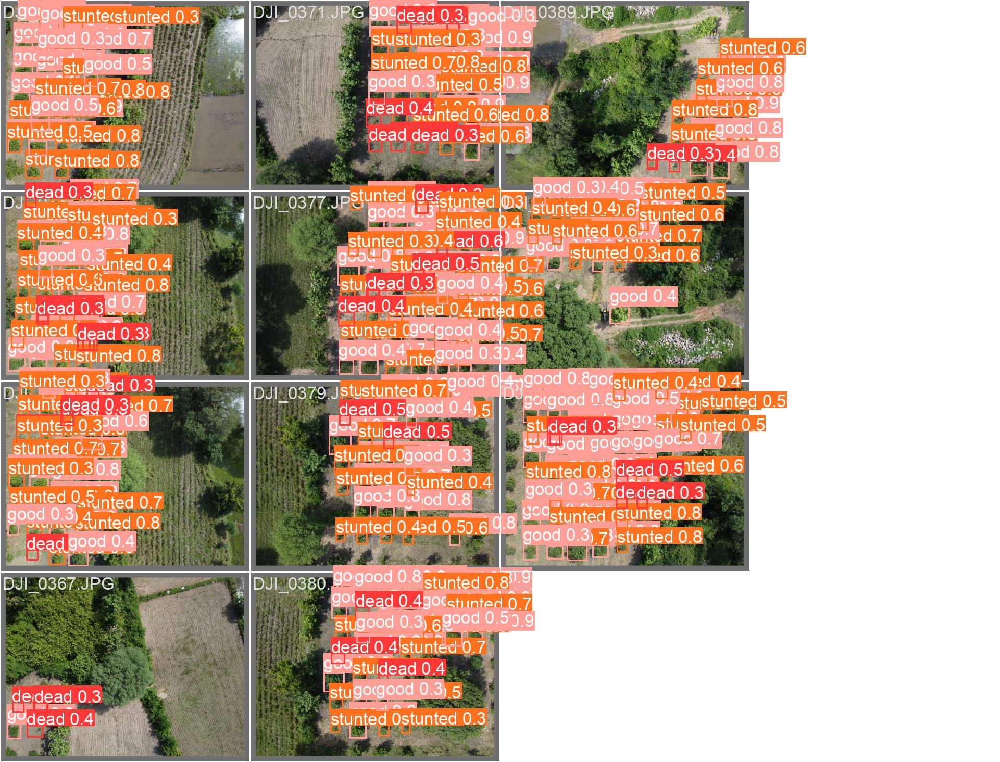

In [ ]:
Image(filename='/content/runs/detect/train6/val_batch0_pred.jpg', width=1000)

**VALIDATING WITH YOLOV8S**

In [ ]:
model.val()

Ultralytics YOLOv8.0.165 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126745 parameters, 0 gradients
val: Scanning /content/drive/MyDrive/parigi50/labels/val.cache... 11 images, 1 backgrounds, 0 corrupt: 100%|██████████| 11/11 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:05<00:00,  5.03s/it]
                   all         11        311      0.764      0.748      0.789      0.391
                  dead         11         40      0.693      0.475      0.553      0.189
                  good         11        162      0.844      0.889      0.945      0.582
               stunted         11        109      0.756      0.881      0.868      0.403
Speed: 0.2ms preprocess, 17.9ms inference, 0.0ms loss, 2.5ms postprocess per image
Results saved to runs/detect/val2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a354036b460>
fitness: 0.4307834332765251
keys: ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']
maps: array([    0.18872,     0.58152,     0.40279])
names: {0: 'dead', 1: 'good', 2: 'stunted'}
plot: True
results_dict: {'metrics/precision(B)': 0.7641653016565125, 'metrics/recall(B)': 0.7484066340743473, 'metrics/mAP50(B)': 0.7887616239114835, 'metrics/mAP50-95(B)': 0.39100807876152965, 'fitness': 0.4307834332765251}
save_dir: PosixPath('runs/detect/val2')
speed: {'preprocess': 0.199447978626598, 'inference': 17.944596030495383, 'loss': 0.001322139393199574, 'postprocess': 2.537207169966264}

**VALIDATION RESULTS USING YOLOV8S**

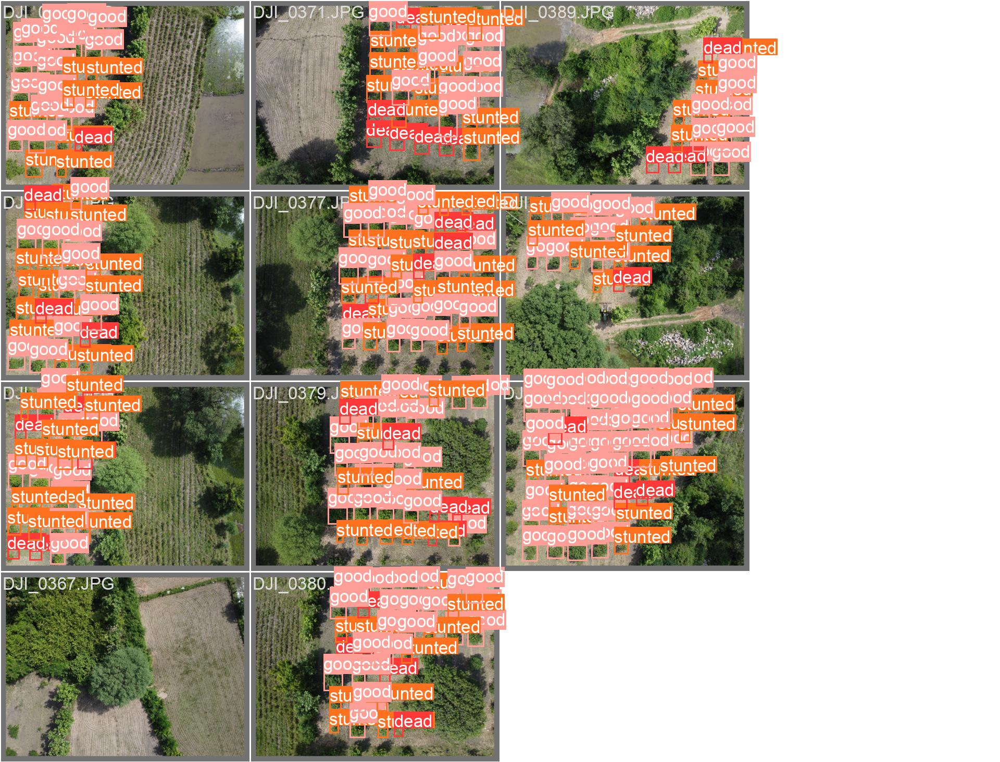

In [ ]:
Image(filename='/content/runs/detect/val2/val_batch0_labels.jpg', width=1000)

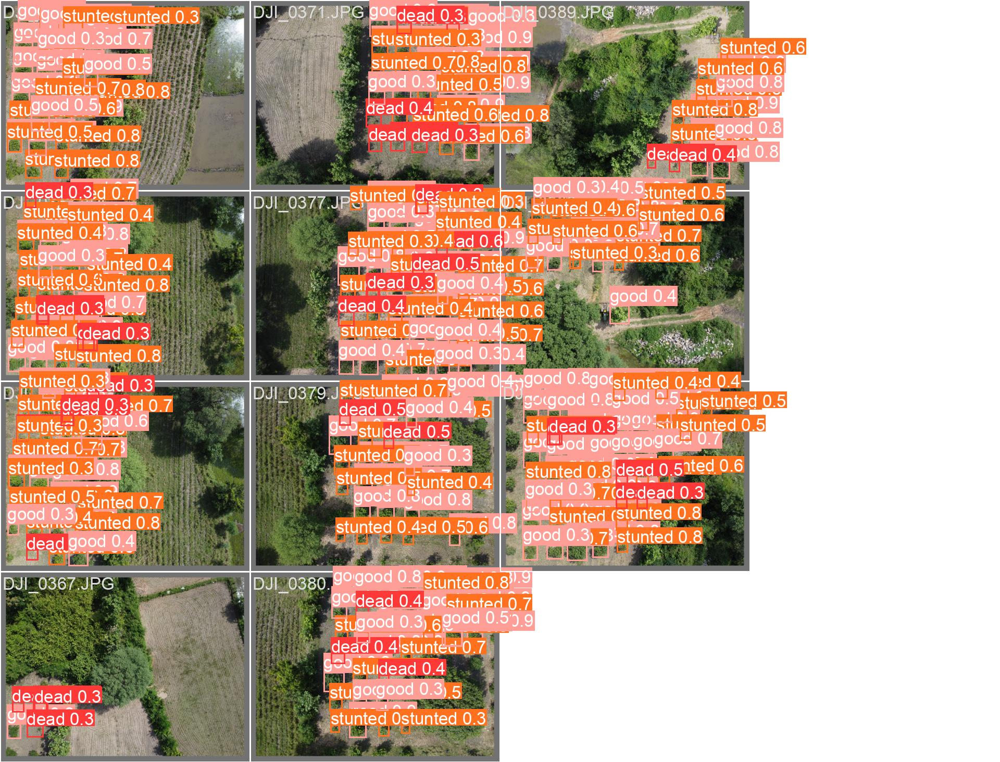

In [ ]:
Image(filename='/content/runs/detect/val2/val_batch0_pred.jpg', width=1000)

**PREDICTION**

In [ ]:
model.predict('//content/drive/MyDrive/predictData/DJI_0401.JPG',save=True)


image 1/1 //content/drive/MyDrive/predictData/DJI_0401.JPG: 480x640 1 dead, 47 goods, 33 stunteds, 73.1ms
Speed: 3.5ms preprocess, 73.1ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)
Results saved to runs/detect/predict


[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'dead', 1: 'good', 2: 'stunted'}
 orig_img: array([[[ 57,  56,  52],
         [ 53,  52,  48],
         [ 56,  55,  51],
         ...,
         [ 21,  27,  22],
         [ 20,  26,  21],
         [ 13,  19,  14]],
 
        [[ 55,  54,  50],
         [ 55,  54,  50],
         [ 59,  58,  54],
         ...,
         [ 21,  27,  22],
         [ 21,  27,  22],
         [ 15,  21,  16]],
 
        [[ 59,  60,  56],
         [ 57,  58,  54],
         [ 57,  58,  54],
         ...,
         [ 16,  22,  17],
         [ 17,  23,  18],
         [ 12,  18,  13]],
 
        ...,
 
        [[123, 151, 158],
         [122, 150, 157],
         [123, 151, 158],
         ...,
         [ 15,  22,  19],
         [ 17,  24,  21],
         [ 18,  25,  22]],
 
        [[123, 151, 158],
         [125, 153, 160],
         [125, 153, 160],
         ...,
      

**PREDICTION RESULTS**

In [ ]:
from IPython.display import Image

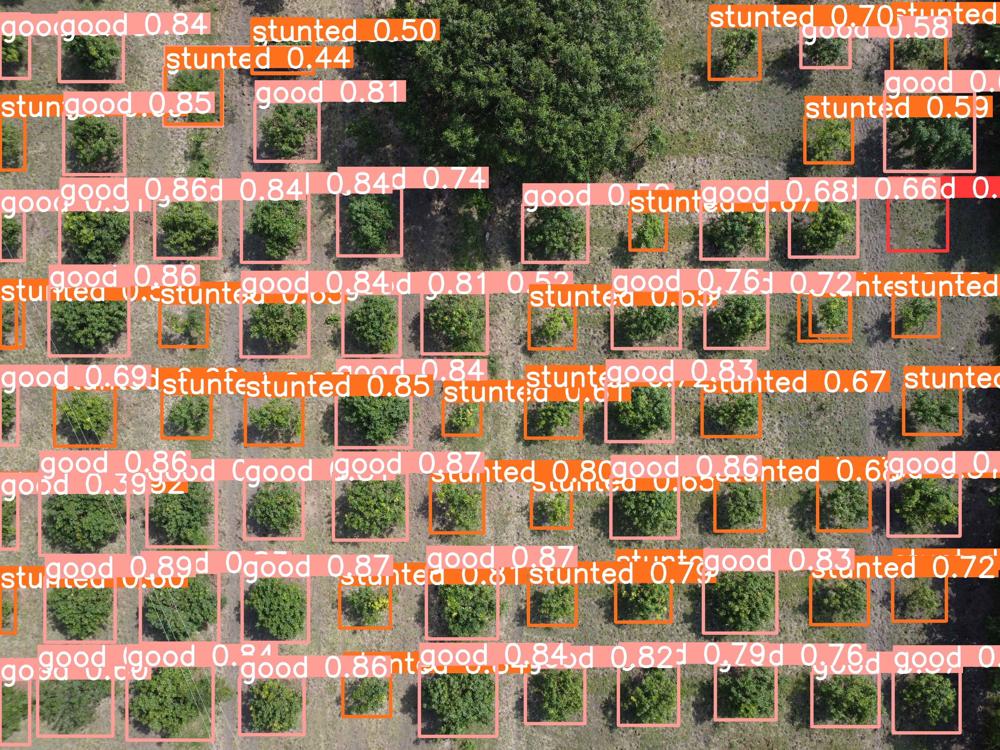

In [ ]:
Image(filename='/content/runs/detect/predict/DJI_0401.JPG', width=1000)